<!-- codex-purpose-v2 -->
# 03 - XAI Analysis Roadmap: GradCAM, GradCAM++, SAM, And Color Priors

## Purpose
Inspect where the classifier looks and define the analysis criteria used before
turning attention maps into pseudo-label candidates.

## Research Thinking
- GradCAM can localize discriminative regions but may include context, leaf
  body, or background.
- GradCAM++ is explored because many lesions are small, scattered, or
  multi-region.
- SAM is used later as a refinement diagnostic, not as a blind replacement for
  disease masks.
- Disease color priors are checked because lesion classes have visible color and
  texture cues that can filter leaf/background activation noise.
- The visual failures in this notebook motivate adaptive thresholds, SAM
  diagnostics, and disease color priors.

## Inputs / Outputs
- Input: trained EfficientNet-B0 classifier and raw images.
- Output: heatmaps, overlays, confidence summaries, per-class examples, and
  analysis criteria for the pseudo-label notebooks.

## How To Read The Result
Treat heatmaps as evidence, not ground truth. Good heatmaps should overlap
lesion-like regions without expanding across the whole leaf. SAM and color
priors are follow-up checks for boundary quality and disease-specific noise.


# 03 · XAI — Analysis Roadmap Before Pseudo-Labels

Sau khi có model phân loại đạt 98.42% validation accuracy tại checkpoint tốt nhất, bước tiếp theo là hiểu model đang nhìn vào đâu và quyết định tín hiệu nào đủ tin để đi tiếp sang pseudo-label. GradCAM chiếu ngược gradient từ output layer về feature map cuối cùng để tạo heatmap; GradCAM++ được dùng như hướng đối chiếu vì nhiều tổn thương trên lá nhỏ, rải rác, hoặc xuất hiện ở nhiều vùng. SAM và disease color prior được đặt thành các tiêu chí phân tích tiếp theo để kiểm tra biên mask và lọc nhiễu theo màu bệnh.

Kết quả của notebook này không được xem là ground truth pixel-level. Heatmap chỉ là **bằng chứng XAI** để đánh giá xem vùng chú ý có đủ gần tổn thương hay không trước khi biến thành ứng viên pseudo-label ở các notebook sau.

---

**Các điểm cần analysis trước khi tạo pseudo-label:**

1. **GradCAM baseline** — heatmap có nằm trên lesion-like region không, hay chỉ học thân lá/nền/context?
2. **GradCAM++ candidate** — có cải thiện với bệnh dạng nhiều đốm nhỏ, nhiều vùng rời, hoặc vùng tổn thương phân tán không?
3. **Confidence filtering** — ảnh confidence thấp/predict sai có tạo heatmap lệch không, và threshold nào nên dùng trước khi lưu mask?
4. **SAM diagnostics** — SAM có giúp mask bám biên lá/vết bệnh hơn không, hay mở rộng sang vùng lá khỏe/nền?
5. **Disease color prior** — màu nâu/vàng/đen/cháy lá/đốm bệnh có giúp loại activation sai trên nền xanh khỏe không?
6. **Per-class failure cases** — lớp nào cần rule riêng: Healthy nên all-zero, Leaf Blight có vùng lớn, Algal/Phomopsis có đốm nhỏ dễ nhầm.
7. **Decision for next notebooks** — chọn cấu hình đưa sang NB04/NB06/NB08/NB09: threshold, morphology, SAM refinement, và color-prior filtering.

**Những gì notebook này làm:**

1. **Load train data** — toàn bộ 3,104 ảnh train (513–683 ảnh/lớp)
2. **Load model** — nạp `best_model.pth` từ notebook 02
3. **Setup XAI** — dùng target layer cuối cùng của EfficientNet-B0 để sinh heatmap
4. **Chạy GradCAM baseline** — sinh heatmap cho tất cả ảnh, ghi nhận confidence và prediction
5. **Visualization** — so sánh Original | Heatmap | Overlay theo từng lớp
6. **Summary statistics** — tổng hợp accuracy, confidence, và độ tin cậy khi dùng làm pseudo-label candidate
7. **Analysis roadmap** — ghi rõ các câu hỏi cần trả lời bằng GradCAM++, SAM, và color prior ở những notebook kế tiếp

**Output:** Heatmaps/overlays tại `visualizations/gradcam/` · Summary tại `visualizations/gradcam/gradcam_summary.json`

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
import json
proj_root = r'E:\Master\thesis-clean'
sys.path.insert(0, proj_root)
sys.path.insert(0, os.path.join(proj_root, 'utils'))

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import glob
from pathlib import Path
from PIL import Image
from tqdm import tqdm
from collections import defaultdict
import torch
from torchvision import transforms

from utils.models import EfficientNetClassifier
from utils.gradcam import GradCAMGenerator, find_efficientnet_target_layer

# Plot style — nhất quán với notebook 01 & 02
plt.style.use('default')
sns.set_palette("husl")

# Class metadata — nhất quán với notebook 01 & 02
CLASS_NAMES  = ["ALGAL_LEAF_SPOT", "ALLOCARIDARA_ATTACK", "HEALTHY_LEAF", "LEAF_BLIGHT", "PHOMOPSIS_LEAF_SPOT"]
CLASS_LABELS = ["Algal Leaf Spot", "Allocaridara Attack", "Healthy Leaf", "Leaf Blight", "Phomopsis Leaf Spot"]
CLASS_COLORS = ["#E69F00", "#56B4E9", "#009E73", "#0072B2", "#D55E00"]
CLASS_TO_IDX = {name: i for i, name in enumerate(CLASS_NAMES)}
IDX_TO_LABEL = {i: label for i, label in enumerate(CLASS_LABELS)}

VIZ_DIR = "visualizations/gradcam"
os.makedirs(VIZ_DIR, exist_ok=True)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")
print(f"proj_root: {proj_root}")

Device: cuda
proj_root: E:\Master\thesis-clean


## Load Train Data

Grad-CAM chạy trên tập train (không phải test) — mục đích là tạo pseudo-label cho toàn bộ ảnh training để làm dữ liệu huấn luyện segmentation model ở notebook 04+. Test set giữ nguyên để đánh giá cuối.

Lấy toàn bộ ảnh trong mỗi lớp (~513–683 ảnh/lớp, tổng 3,104 ảnh). Class index gán theo thứ tự alphabet của tên thư mục — nhất quán với cách `ImageFolder` gán label trong notebook 02.

In [3]:
train_dir = os.path.join(proj_root, 'notebooks', 'data', 'raw', 'train')
print(f"Train dir: {train_dir}")
print(f"Exists: {os.path.exists(train_dir)}")

# Thu thập ảnh theo CLASS_NAMES để đảm bảo thứ tự nhất quán
selected_samples = []  # list of (img_path, class_idx, class_name)

for cls_name in CLASS_NAMES:
    cls_dir = Path(train_dir) / cls_name
    cls_idx = CLASS_TO_IDX[cls_name]
    imgs = list(cls_dir.glob("*.jpg")) + list(cls_dir.glob("*.png")) + list(cls_dir.glob("*.jpeg"))
    for img_path in imgs:
        selected_samples.append((str(img_path), cls_idx, cls_name))
    print(f"  {cls_name}: {len(imgs)} ảnh")

print(f"\nTổng: {len(selected_samples)} ảnh")

Train dir: E:\Master\thesis-clean\notebooks\data\raw\train
Exists: True
  ALGAL_LEAF_SPOT: 513 ảnh
  ALLOCARIDARA_ATTACK: 639 ảnh
  HEALTHY_LEAF: 683 ảnh
  LEAF_BLIGHT: 655 ảnh
  PHOMOPSIS_LEAF_SPOT: 614 ảnh

Tổng: 3104 ảnh


## Load Model

Nạp `best_model.pth` — checkpoint được lưu khi val_acc đạt peak (epoch 11, 98.19%). File này chỉ chứa model weights, không phải full training state, nên load nhanh và không cần optimizer hay scheduler.

Đặt `model.eval()` để tắt dropout và batch norm stochastic trước khi chạy inference — thiếu bước này kết quả Grad-CAM sẽ không ổn định giữa các lần chạy.

In [4]:
num_classes = len(CLASS_NAMES)
model = EfficientNetClassifier(num_classes=num_classes, backbone='efficientnet_b0', pretrained=False)

ckpt_path = 'models/classification/checkpoints/best_model.pth'
if not os.path.exists(ckpt_path):
    raise FileNotFoundError(f"Không tìm thấy {ckpt_path}. Chạy notebook 02 trước.")

print(f"Loading checkpoint: {ckpt_path}")
checkpoint = torch.load(ckpt_path, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device).eval()
print(f"Model loaded OK — val_acc at save: {checkpoint.get('val_acc', 'N/A'):.4f}")

Loading checkpoint: models/classification/checkpoints/best_model.pth
Model loaded OK — val_acc at save: 0.9842


## Setup XAI Heatmap

EfficientNet-B0 dùng depthwise separable convolution — target layer cho GradCAM là `features.8.0`, lớp conv cuối cùng trước global average pooling. Đây là nơi feature map còn giữ spatial information (7×7) nhưng đã học được feature trừu tượng nhất.

Transform cho inference giống hệt val/test trong notebook 02 — normalize bằng ImageNet mean/std. Không có augmentation vì cần output ổn định.

In [5]:
target_layer = find_efficientnet_target_layer(model)
gradcam_gen = GradCAMGenerator(model, target_layer=target_layer, device=device.type)
print('Grad-CAM target layer:', target_layer)

# Transform cho inference
infer_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

Grad-CAM target layer: base.features.8.0


## Chạy GradCAM Baseline

Với mỗi ảnh: load → tensor → forward pass → lấy gradient từ predicted class → weighted sum trên feature map → normalize về [0,1] → overlay lên ảnh gốc.

Kết quả lưu theo class để dễ phân tích per-class sau này. Ghi nhận `confidence` và `pred_class` để biết model chắc chắn ở mức nào và có predict đúng không — những ảnh predict sai hoặc confidence thấp cần được xem là heatmap kém tin cậy khi tạo pseudo-label.

In [6]:
results_by_class = defaultdict(list)

for img_path, cls_idx, cls_name in tqdm(selected_samples, desc="Generating GradCAM"):
    try:
        orig_img = Image.open(img_path).convert("RGB").resize((224, 224))
        orig_arr = np.array(orig_img)  # uint8 (224, 224, 3)

        input_tensor = infer_transform(orig_img).unsqueeze(0).to(device)

        heatmap, confidence, pred_class = gradcam_gen.generate(input_tensor, cls_idx)

        # torchcam trả về feature map size (e.g. 7×7), manual hooks đã resize — normalize về (H, W) 224×224
        heatmap_2d = np.squeeze(heatmap)
        if heatmap_2d.shape != (224, 224):
            heatmap_2d = cv2.resize(heatmap_2d, (224, 224))
        heatmap_2d = np.clip(heatmap_2d, 0, 1)

        heatmap_colored = cv2.applyColorMap((heatmap_2d * 255).astype(np.uint8), cv2.COLORMAP_JET)
        heatmap_rgb = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
        overlay = cv2.addWeighted(orig_arr, 0.6, heatmap_rgb, 0.4, 0)

        results_by_class[cls_name].append({
            "img_path": img_path,
            "orig_arr": orig_arr,
            "heatmap": heatmap_2d,
            "overlay": overlay,
            "confidence": confidence,
            "pred_class": pred_class,
            "true_class": cls_idx,
        })
    except Exception as e:
        print(f"  Lỗi {img_path}: {e}")

print("\nKết quả:")
for cls_name, items in results_by_class.items():
    correct = sum(1 for x in items if x["pred_class"] == x["true_class"])
    print(f"  {IDX_TO_LABEL[CLASS_TO_IDX[cls_name]]}: {len(items)} ảnh, accuracy={correct/len(items):.2%}")

Generating GradCAM: 100%|██████████| 3104/3104 [11:04<00:00,  4.67it/s] 


Kết quả:
  Algal Leaf Spot: 513 ảnh, accuracy=100.00%
  Allocaridara Attack: 639 ảnh, accuracy=100.00%
  Healthy Leaf: 683 ảnh, accuracy=100.00%
  Leaf Blight: 655 ảnh, accuracy=99.85%
  Phomopsis Leaf Spot: 614 ảnh, accuracy=99.84%


## Visualization And Review Criteria

Hai chart:
1. **3 ảnh ngẫu nhiên mỗi lớp** — nhìn thấy tính nhất quán của heatmap trong cùng lớp
2. **1 ảnh best confidence mỗi lớp** — ảnh model chắc nhất, heatmap thường rõ ràng nhất

Mỗi row gồm 3 cột: Original | Heatmap (JET colormap, đỏ = attention cao) | Overlay (blend 60% gốc + 40% heatmap). Heatmap tốt nên bám vùng giống tổn thương, không lan phủ toàn lá và không bị hút mạnh vào nền.

**Rubric analysis:**

- **Localization**: vùng đỏ/cam có trùng vị trí tổn thương nhìn thấy bằng mắt không?
- **Specificity**: heatmap có tránh vùng lá khỏe, cuống lá, viền ảnh, nền chụp không?
- **Coverage**: vùng kích hoạt có quá nhỏ làm mất lesion, hay quá lớn làm mask phình ra toàn lá?
- **Multi-region behavior**: với bệnh nhiều đốm, GradCAM có bỏ sót nhiều vùng không; nếu có, GradCAM++ là ứng viên cải thiện.
- **Boundary readiness**: heatmap có đủ gần biên tổn thương để threshold trực tiếp không; nếu không, cần SAM refinement/diagnostic.
- **Color consistency**: activation có rơi vào màu bệnh hợp lý không; nếu không, cần disease color prior để lọc nhiễu.


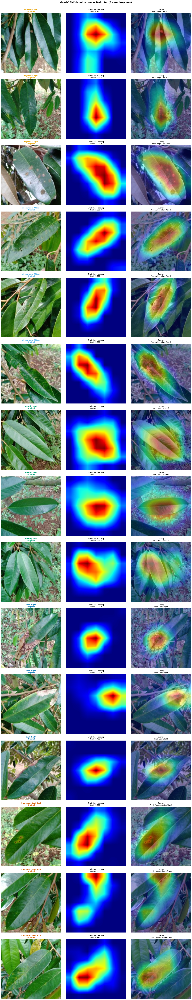

Saved → visualizations/gradcam/gradcam_samples_per_class.png


In [7]:
n_classes = len(CLASS_NAMES)
n_samples_show = 3

fig, axes = plt.subplots(n_classes * n_samples_show, 3, figsize=(15, 5 * n_classes * n_samples_show))
fig.suptitle("Grad-CAM Visualization — Train Set (3 samples/class)", fontsize=13, fontweight="bold", y=1.001)

row = 0
for cls_name, cls_label, cls_color in zip(CLASS_NAMES, CLASS_LABELS, CLASS_COLORS):
    items = results_by_class.get(cls_name, [])
    for s_idx in range(min(n_samples_show, len(items))):
        item = items[s_idx]
        correct_str = "✓" if item["pred_class"] == item["true_class"] else "✗"

        axes[row, 0].imshow(item["orig_arr"])
        axes[row, 0].set_title(f"{cls_label}\nOriginal", fontsize=9, fontweight="bold", color=cls_color)
        axes[row, 0].axis("off")

        axes[row, 1].imshow(item["heatmap"], cmap="jet")
        axes[row, 1].set_title(f"Grad-CAM Heatmap\nConf={item['confidence']:.3f} {correct_str}", fontsize=9)
        axes[row, 1].axis("off")

        axes[row, 2].imshow(item["overlay"])
        axes[row, 2].set_title(f"Overlay\nPred: {IDX_TO_LABEL.get(item['pred_class'], item['pred_class'])}", fontsize=9)
        axes[row, 2].axis("off")

        row += 1

plt.tight_layout()
plt.savefig(os.path.join(VIZ_DIR, "gradcam_samples_per_class.png"), dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved → {VIZ_DIR}/gradcam_samples_per_class.png")

**Nhận xét — GradCAM samples:**

Quan sát heatmap trên 3 ảnh mỗi lớp cho thấy model học được tín hiệu nằm chủ yếu trên vùng lá, nhưng mức độ hữu ích cho pseudo-label khác nhau theo lớp:

- **Algal Leaf Spot**: Một số ảnh có attention gần vùng đốm, nhưng cũng có ca heatmap gom vào vùng lá rộng hơn lesion thật. Nếu threshold trực tiếp, mask dễ phình ra phần lá khỏe.
- **Allocaridara Attack**: Heatmap thường bám theo dải/vùng lá có dấu vết côn trùng, nhưng activation vẫn khá rộng so với lỗ thủng hoặc vết cắn. Cần morphology/threshold để tránh mask quá lớn.
- **Healthy Leaf**: Vẫn sinh vùng nóng lớn dù không có tổn thương. Đây là cảnh báo quan trọng: Healthy không nên lấy GradCAM làm mask bệnh, mà nên ép all-zero mask hoặc rule riêng.
- **Leaf Blight**: Attention thường tập trung vào vùng cháy/hoại tử lớn, phù hợp hơn với dạng bệnh có lesion diện rộng. Tuy vậy biên heatmap vẫn mềm, nên mask cần refinement nếu muốn sát vùng bệnh.
- **Phomopsis Leaf Spot**: Heatmap bắt được khu vực có đốm nhưng có xu hướng lan theo gân/thân lá hoặc vùng lá khỏe. Đây là nhóm nên thử GradCAM++ và color prior để giữ các đốm nhỏ đúng màu bệnh.

Tất cả sample trực quan trong hình đều được predict đúng, nhưng điều này không có nghĩa heatmap đủ tốt làm ground truth. Vấn đề chính sau khi xem hình là **localization noise**: GradCAM có thể đúng class nhưng vẫn bao phủ lá khỏe, nền, hoặc vùng rộng hơn tổn thương thật.

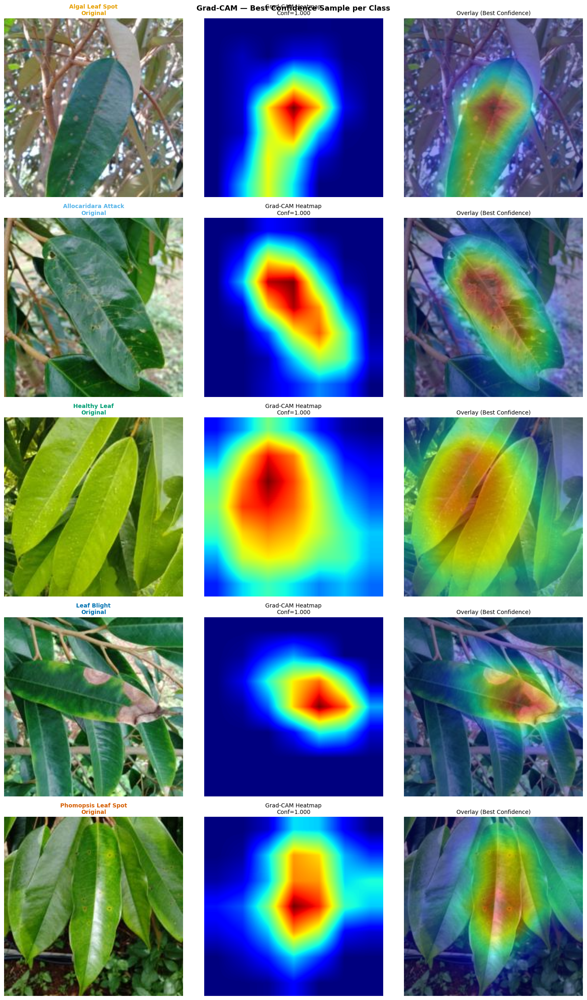

Saved → visualizations/gradcam/gradcam_best_per_class.png


In [8]:
fig2, axes2 = plt.subplots(n_classes, 3, figsize=(15, 5 * n_classes))
fig2.suptitle("Grad-CAM — Best Confidence Sample per Class", fontsize=13, fontweight="bold")

for i, (cls_name, cls_label, cls_color) in enumerate(zip(CLASS_NAMES, CLASS_LABELS, CLASS_COLORS)):
    items = results_by_class.get(cls_name, [])
    if not items:
        continue
    best = max(items, key=lambda x: x["confidence"])

    axes2[i, 0].imshow(best["orig_arr"])
    axes2[i, 0].set_title(f"{cls_label}\nOriginal", fontsize=10, fontweight="bold", color=cls_color)
    axes2[i, 0].axis("off")

    axes2[i, 1].imshow(best["heatmap"], cmap="jet")
    axes2[i, 1].set_title(f"Grad-CAM Heatmap\nConf={best['confidence']:.3f}", fontsize=10)
    axes2[i, 1].axis("off")

    axes2[i, 2].imshow(best["overlay"])
    axes2[i, 2].set_title("Overlay (Best Confidence)", fontsize=10)
    axes2[i, 2].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(VIZ_DIR, "gradcam_best_per_class.png"), dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved → {VIZ_DIR}/gradcam_best_per_class.png")

**Nhận xét — Best confidence per class:**

Ảnh confidence cao nhất của mỗi lớp đều đạt xấp xỉ 1.000, nhưng visualization cho thấy confidence cao chỉ xác nhận model rất chắc về class, không đảm bảo mask bệnh chính xác ở cấp pixel. Điều này cho thấy:

- **High-confidence heatmap là ứng viên tốt hơn**, nhưng vẫn cần kiểm tra localization trước khi dùng làm pseudo-label.
- **Healthy Leaf** là failure case rõ nhất: confidence = 1.000 nhưng heatmap vẫn nóng trên lá khỏe, nên nếu tạo mask trực tiếp sẽ sinh false-positive lesion.
- **Algal/Phomopsis** có đốm nhỏ nhưng heatmap best-case vẫn lan thành vùng lớn, vì vậy GradCAM++ multi-scale và disease color prior là hướng hợp lý để giữ nhiều đốm nhỏ và giảm vùng lá khỏe.
- **Leaf Blight** phù hợp với GradCAM hơn do tổn thương lớn, nhưng biên mask vẫn cần threshold/morphology hoặc SAM diagnostic để tránh phình vùng.
- Confidence threshold vẫn cần thiết, nhưng không đủ một mình; nên kết hợp với class rule, adaptive threshold, và lọc màu bệnh.

## Summary Statistics

Accuracy và confidence per class trên toàn bộ train set — kiểm tra xem model có nhất quán không hay chỉ đúng ngẫu nhiên. Mean confidence cao cho thấy classifier ổn định, nhưng **không đồng nghĩa heatmap là mask tốt**. Confidence chủ yếu dùng để lọc ảnh rủi ro; chất lượng pseudo-label vẫn cần đánh giá bằng localization, coverage, boundary, và color consistency.

In [9]:
summary = {}
for cls_name, items in results_by_class.items():
    correct = sum(1 for x in items if x["pred_class"] == x["true_class"])
    confs = [x["confidence"] for x in items]
    summary[cls_name] = {
        "n_samples": len(items),
        "accuracy": correct / len(items) if items else 0,
        "mean_confidence": float(np.mean(confs)) if confs else 0,
        "min_confidence": float(np.min(confs)) if confs else 0,
        "max_confidence": float(np.max(confs)) if confs else 0,
    }

print("=== Grad-CAM Summary (Train set) ===")
for cls_name, stats in summary.items():
    label = IDX_TO_LABEL[CLASS_TO_IDX[cls_name]]
    print(f"  {label}: n={stats['n_samples']}, acc={stats['accuracy']:.2%}, "
          f"conf_mean={stats['mean_confidence']:.3f}, conf_min={stats['min_confidence']:.3f}")

summary_path = os.path.join(VIZ_DIR, "gradcam_summary.json")
with open(summary_path, "w") as f:
    json.dump(summary, f, indent=2)
print(f"\nSummary saved: {summary_path}")

=== Grad-CAM Summary (Train set) ===
  Algal Leaf Spot: n=513, acc=100.00%, conf_mean=0.993, conf_min=0.655
  Allocaridara Attack: n=639, acc=100.00%, conf_mean=0.999, conf_min=0.745
  Healthy Leaf: n=683, acc=100.00%, conf_mean=0.996, conf_min=0.612
  Leaf Blight: n=655, acc=99.85%, conf_mean=0.992, conf_min=0.387
  Phomopsis Leaf Spot: n=614, acc=99.84%, conf_mean=0.991, conf_min=0.478

Summary saved: visualizations/gradcam\gradcam_summary.json


**Nhận xét — Summary (full train set, 3,104 ảnh):**

- **Accuracy train rất cao: 99.84%–100.00%** — model phân loại gần như hoàn hảo trên 3,104 ảnh train khi inference không augmentation.
- **Algal Leaf Spot, Allocaridara Attack, Healthy Leaf đạt 100.00% train accuracy** — nhưng visualization cho thấy đúng class không đồng nghĩa heatmap sát lesion.
- **Leaf Blight và Phomopsis Leaf Spot là hai lớp còn lỗi nhẹ**: Leaf Blight đạt 99.85%, Phomopsis đạt 99.84%, tương đương khoảng 1 ảnh sai ở mỗi lớp.
- **Allocaridara confidence cao nhất** (conf_mean=0.999, conf_min=0.745) — đây là lớp ổn định nhất theo classifier confidence.
- **Leaf Blight có confidence thấp nhất ở worst case** (conf_min=0.387), tiếp theo là Phomopsis (0.478). Các ảnh này cần được lọc hoặc kiểm tra trước khi tạo pseudo-label.
- **Healthy Leaf có conf_mean cao (0.996) nhưng vẫn tạo vùng nóng trong visualization** — nên Healthy phải có rule riêng, không dùng heatmap như lesion mask.

---

## Kết luận

GradCAM trên toàn bộ 3,104 ảnh train cho thấy EfficientNet-B0 phân loại rất ổn định, nhưng heatmap vẫn chỉ là bằng chứng gián tiếp. Kết quả trực quan cho thấy mô hình thường nhìn vào vùng lá liên quan đến bệnh, song vẫn có các lỗi quan trọng cho segmentation: heatmap phình ra lá khỏe, bỏ sót đốm nhỏ, hoặc tạo activation trên Healthy Leaf. Vì vậy notebook này nên được đọc như bước **diagnostic trước pseudo-label**, không phải bước tạo ground-truth mask.

**Tóm tắt kết quả (full train set):**

| Lớp | Số ảnh | Accuracy | Mean Conf | Min Conf |
|---|:---:|:---:|:---:|:---:|
| Algal Leaf Spot | 513 | 100.00% | 0.993 | 0.655 |
| Allocaridara Attack | 639 | 100.00% | 0.999 | 0.745 |
| Healthy Leaf | 683 | 100.00% | 0.996 | 0.612 |
| Leaf Blight | 655 | 99.85% | 0.992 | 0.387 |
| Phomopsis Leaf Spot | 614 | 99.84% | 0.991 | 0.478 |

**Decision matrix cho các notebook sau:**

| Vấn đề quan sát trong NB03 | Hướng xử lý | Notebook |
|---|---|---|
| Heatmap GradCAM đủ tập trung và confidence cao | Threshold + morphology để tạo binary mask v1 | NB04 |
| Đốm nhỏ/rải rác bị bỏ sót hoặc gom thành vùng lớn | Thử GradCAM++ multi-scale để tăng khả năng bắt nhiều vùng | NB06 |
| Mask thô, biên không bám tổn thương hoặc bám sai vùng lá | Dùng SAM như diagnostic/refinement, kiểm tra có cải thiện biên thật không | NB08 |
| Heatmap bám lá khỏe/nền hoặc lan quá rộng | Intersect với disease color prior để lọc activation không giống màu bệnh | NB09 |
| Healthy Leaf vẫn sinh vùng nóng dù confidence cao | Ép all-zero mask hoặc rule riêng cho lớp healthy | NB04+ |

**Bước tiếp theo:** Notebook 04 có thể chuyển GradCAM heatmap thành binary mask v1, nhưng nên dùng confidence threshold tối thiểu khoảng 0.5 để loại worst-case Leaf Blight/Phomopsis và áp rule all-zero cho Healthy Leaf. Các failure case quan sát được ở đây là cơ sở để thử GradCAM++, SAM diagnostics, và disease color priors ở các phiên bản pseudo-label tiếp theo.